# Results
This script uses data from cases that have output in chronological order and creates a time series figure

## Import modules

In [1]:
import sys
sys.path.append('/glade/u/home/adamhb/Earth-System-Model-Tools')
import os
import numpy as np
import pandas as pd
from matplotlib.dates import DateFormatter
from datetime import datetime#,timedelta
import esm_tools
from matplotlib import pyplot as plt
import seaborn as sns
pd.set_option('display.max_rows', 500)

## Set paths and parameters

In [2]:
saveFig = True

# Path to where the final figures should be stored
figOut = '/glade/u/home/adamhb/california-fates/figures'

# Tags that have passed the ecological criteria
tags = esm_tools.inst_to_tag(np.load('/glade/work/adamhb/processed_output/supIg105_020224/old/inst_supIg105_020224.npy'))

######################
#####Time Series######
######################

# Path to the suppression case time series data
ts_sup_data_path = '/glade/work/adamhb/processed_output/supIg105_020224/ts_supIg105_020224.csv'
# Path to the no suppression case time series
ts_HF_data_path = '/glade/work/adamhb/processed_output/HF_020424/ts_HF_020424.csv'
ts_HF_ig105_path = '/glade/work/adamhb/processed_output/HF_ig105_021324-2015-2098_-17e2acb6a_FATES-5b076b69/ts_HF_ig105.csv'

###################
#####Metrics#######
###################
# Path to PEAS data
met_peas_path = '/glade/work/adamhb/processed_output/CZ2_equilibrium_011824_-17e2acb6a_FATES-5b076b69/eq_metrics_020624.csv'


# Path to early 20th century supression data
met_early_20th_sup_path = '/glade/work/adamhb/processed_output/supIg105_020224-1951-2020_-17e2acb6a_FATES-5b076b69/supIg105_020224_1970-2010.csv'
met_early_20th_HF_path = '/glade/work/adamhb/processed_output/HF_020424-1951-2020_-17e2acb6a_FATES-5b076b69/HF_020424_1970-2010.csv'


# Path to late 20th century suppression data
met_late_20th_sup_path = '/glade/work/adamhb/processed_output/supIg105_020224-2015-2098_-17e2acb6a_FATES-5b076b69/supIg105_020224_2058-2098.csv'
met_late_20th_HF_path = '/glade/work/adamhb/processed_output/HF_020424-2015-2098_-17e2acb6a_FATES-5b076b69/HF_020424_2058-2098.csv'


# Vars to plot for time series

vars = ['AGCD',
 'BA_conifer',
 'BA_pine',
 'BA_cedar',
 'BA_fir',
 'BA_oak',
 'TreeStemD',
 'Pct_shrub_cover_canopy',
 'Pct_shrub_cover',
 'Burned_area',
 'Pct_conifer_cover_canopy',
 'Pct_oak_cover_canopy',
 'Combustible_fuel',
 'Pct_high_severity_1700',
 'Pct_high_severity_3500']

## Variable long names

In [3]:
# variable long names for figure axes
vln = {'Burned_area':'Burned area [% yr-1]',
       'Pct_high_severity_3500':'High severity fire [% of all fire] (3500 kW m-1)',
       'Pct_high_severity_1700':'High severity fire [% of all fire] (1700 kW m-1)',
       'AGCD':'Above-ground carbon density [Kg C m-2]',
       'BA_conifer':'Conifer basal area (dbh > 10 cm) [m-2 ha-1]',
       'Pct_conifer_cover_canopy':'Oak cover [%]',
       'Pct_shrub_cover_canopy':'Shrub cover [%]',
       'Pct_oak_cover_canopy':'Oak cover [%]',
       'BA_pine':'Pine basal area (dbh > 10 cm) [m-2 ha-1]',
       'BA_cedar':'Cedar basal area (dbh > 10 cm) [m-2 ha-1]',
       'BA_fir':'Fir basal area (dbh > 10 cm) [m-2 ha-1]',
       'TreeStemD':'Tree Stem Density [N ha-1] (> 10 cm dbh)',
       'Combustible_fuel':'Combustible fuel [Kg C m-2]',
       'NPP':'NPP'
       }

## Functions

In [4]:
def load_processed_data(path):    
    
    raw_cols = pd.read_csv(path).columns
    if "Date" in raw_cols:
        d = drop_unnamed_columns(pd.read_csv(path,parse_dates=["Date"]))
    else:
        d = drop_unnamed_columns(pd.read_csv(path))
        
    if "inst_tag" in d.columns:
        d['inst_tag'] = esm_tools.inst_to_tag(d['inst_tag'])
        d = d.loc[d['inst_tag'].isin(tags)]
    return d

def metrics_diff(df1,df2):
    if df1.shape != df2.shape:
        raise ValueError("Dataframe are not the same shape")

    if not list(df1['inst_tag']) == list(df2['inst_tag']):
        raise ValueError("Tags are not the same")

    tags = list(df1['inst_tag'])
    col_headers = list(df1.drop(columns = 'inst_tag').columns)

    data1 = df1.drop(columns = 'inst_tag').values
    data2 = df2.drop(columns = 'inst_tag').values

    delta = (data1 - data2) / data2 * 100
    threshold = 10000000
    # Replace values larger than the threshold with zero
    delta[delta > threshold] = 0
    delta = np.nan_to_num(delta, nan=np.nan)
    
    out = pd.DataFrame(delta,columns=col_headers)
    out['inst_tag'] = tags
    out = out[df1.columns]
    
    return out

def drop_unnamed_columns(df):
    # Get the list of column names
    column_names = df.columns
    
    # Filter the column names that contain "Unnamed"
    unnamed_columns = [col for col in column_names if 'Unnamed' in col]
    
    # Drop the unnamed columns from the DataFrame
    df = df.drop(columns=unnamed_columns)
    
    return df

def drop_first_col(d):
    return d.drop(d.columns[0], axis=1)

def get_basename_wo_exnt(full_path):
    return os.path.splitext(os.path.basename(full_path))[0]

def make_ts_fig(ts_sup_data):

    # Set the number of columns for the subplots
    num_cols = 2
    
    # Calculate the number of rows needed for subplots
    num_rows = (len(vln.keys()) + num_cols - 1) // num_cols
    
    # Convert the year 1870 to a datetime object
    year_1870 = datetime(1870, 1, 1)
    plt.rc('font', size=16)
    #default_font_size = 16
    
    # Create a figure with subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 30), dpi=200)
    axes = axes.flatten()
    
    ts_sup_data_PHS = ts_sup_data.dropna()
    
    # Loop through each variable and create a subplot
    for i, var in enumerate(vln.keys()):
        ax = axes[i]
    
        if (var == "Pct_high_severity_1700") | (var == "Pct_high_severity_3500"):
           sns.lineplot(x="Date", y=var, units="inst_tag", data=ts_sup_data_PHS, ax=ax, color = "grey", alpha = 0.2, estimator=None)
        else:
           sns.lineplot(x="Date", y=var, units="inst_tag", data=ts_sup_data, ax=ax, color = "grey", alpha = 0.2, estimator=None)

        ax.set_title(vln[var])
        ax.set_ylabel(vln[var])
        
        # Set plot title and labels
        if var == "Burned_area":
        #     ax.set_title("Fractional area burned")
        #     ax.set_ylabel("Area burned [% simulation area]")
            ax.set_ylim(ymin=0)  # Set ymin for the Burned_area panel to be 0
        # elif var == "Pct_high_severity_1700":
        #     ax.set_title("Percent of fires burning \n at high severity")
        #     ax.set_ylabel("Percent of fires \n high severity")
        # elif var == "TreeStemD":
        #     ax.set_title("Tree stem density")
        #     ax.set_ylabel("Tree stem density [N ha-1]")
        # elif var == "Pct_shrub_cover_canopy":
        #     ax.set_title("Shrub cover")
        #     ax.set_ylabel("Shrub cover [% ground area]")
        # elif var == "BA_conifer":
        #     ax.set_title("Conifer basal area")
        #     ax.set_ylabel("Basal area [m2 ha-1]")
        # elif var == "BA_oak":
        #     ax.set_title("Oak basal area")
        #     ax.set_ylabel("Basal area [m2 ha-1]")
        # elif var == "Pct_conifer_cover_canopy":
        #     ax.set_title("Conifer cover")
        #     ax.set_ylabel("Conifer cover [% ground area]")
        # elif var == "Pct_oak_cover_canopy":
        #     ax.set_title("Oak cover")
        #     ax.set_ylabel("Oak cover [% ground area]")
    
        ax.set_xlabel("Year")  # Change the x-axis label to "Year"
         # Add a vertical line at 1870 to all panels
        ax.axvline(x=year_1870, color="red", linestyle="--")
    
        # Add a black trend line representing the mean of the groups
    
    
        if (var == "Pct_high_severity_1700") | (var == "Pct_high_severity_3500"):
           mean_values = ts_sup_data_PHS.groupby("Date")[var].mean()
        else:
           mean_values = ts_sup_data.groupby("Date")[var].mean()
    
        ax.plot(mean_values.index, mean_values.values, color="black", linestyle="--", label="Mean")
    
        # Remove the legend
        #ax.get_legend().remove()
    
    # Remove any empty subplots
    for i in range(len(vln.keys()), num_rows * num_cols):
        fig.delaxes(axes[i])
    
    # Adjust layout
    plt.tight_layout()

    if saveFig == True:
        figName = os.path.join(figOut,get_basename_wo_exnt(ts_sup_data_path) + '.pdf')
        print(figName)
        plt.savefig(figName)
    
    # Show the plot
    plt.show()


def HistModelObs(modData,Obs,Var):
    '''
    Returns a histogram comparing the model data to a range of observations

    Inputs:
    - modData: dataframe of model metrics
    - Obs: dictionary of observations from the literature. Each list is a range of a particular observation
    - Var: variable name to plot

    Output:
    - histogram
    '''
    var_data = modData[Var]
    
    if Var in ['Pct_shrub_cover_canopy','Burned_area']:
        var_data = var_data * 100
        
    n, bins, patches = plt.hist(var_data, bins=15, alpha=0.9, color='white', edgecolor='black', label = "Model")
    line1 = plt.axvline(x=Obs[Var][0], color='black', linestyle='--', linewidth=2, label = "Obs. range")
    line2 = plt.axvline(x=Obs[Var][1], color='black', linestyle='--', linewidth=2)
    plt.xlabel(vln[Var])
    plt.ylabel("Number of ensemble members")
    plt.legend()
    plt.tight_layout()
    plt.show()

## Read in and clean data

In [15]:
# Time series data
ts_sup_data = load_processed_data(ts_sup_data_path)
ts_HF_data = load_processed_data(ts_HF_data_path)

# Get HF with the ig105 for the future
ts_HFig105_data_2015_2099 = load_processed_data(ts_HF_ig105_path)
tmp = ts_HF_data.loc[ts_HF_data['Date'] < "2015-01-01"]
ts_HFig105_data = pd.concat([tmp,ts_HFig105_data_2015_2099],axis = 0)

# Metrics
met_early20th_sup = load_processed_data(met_early_20th_sup_path)
sup_cols = met_early20th_sup.columns
met_peas = load_processed_data(met_peas_path)[sup_cols]

met_early20th_HF = load_processed_data(met_early_20th_HF_path)
met_late_20th_sup = load_processed_data(met_late_20th_sup_path)
met_late_20th_HF = load_processed_data(met_late_20th_HF_path)

met_late_20th_HFig105 = 

## Timeseries suppression

/glade/u/home/adamhb/california-fates/figures/ts_supIg105_020224.pdf


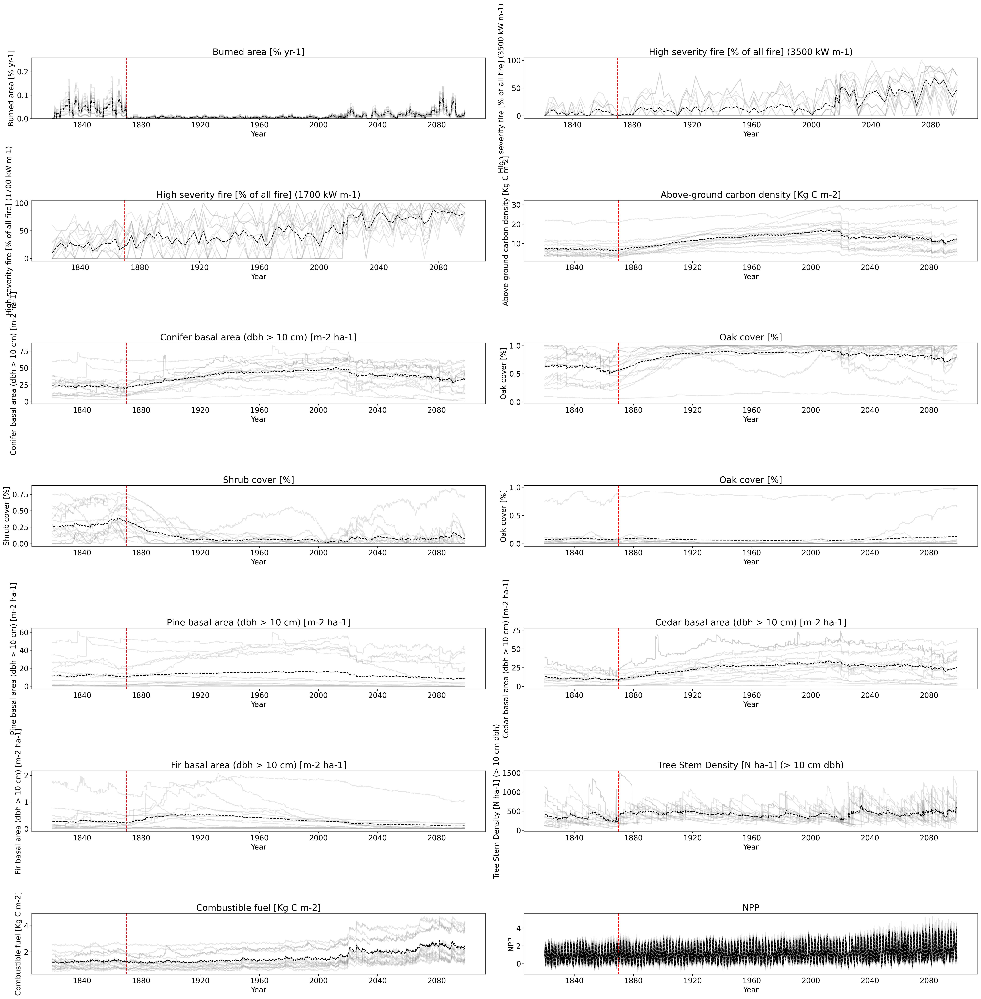

In [41]:
make_ts_fig(ts_sup_data)

## Timeseries no suppression

/glade/u/home/adamhb/california-fates/figures/ts_supIg105_020224.pdf


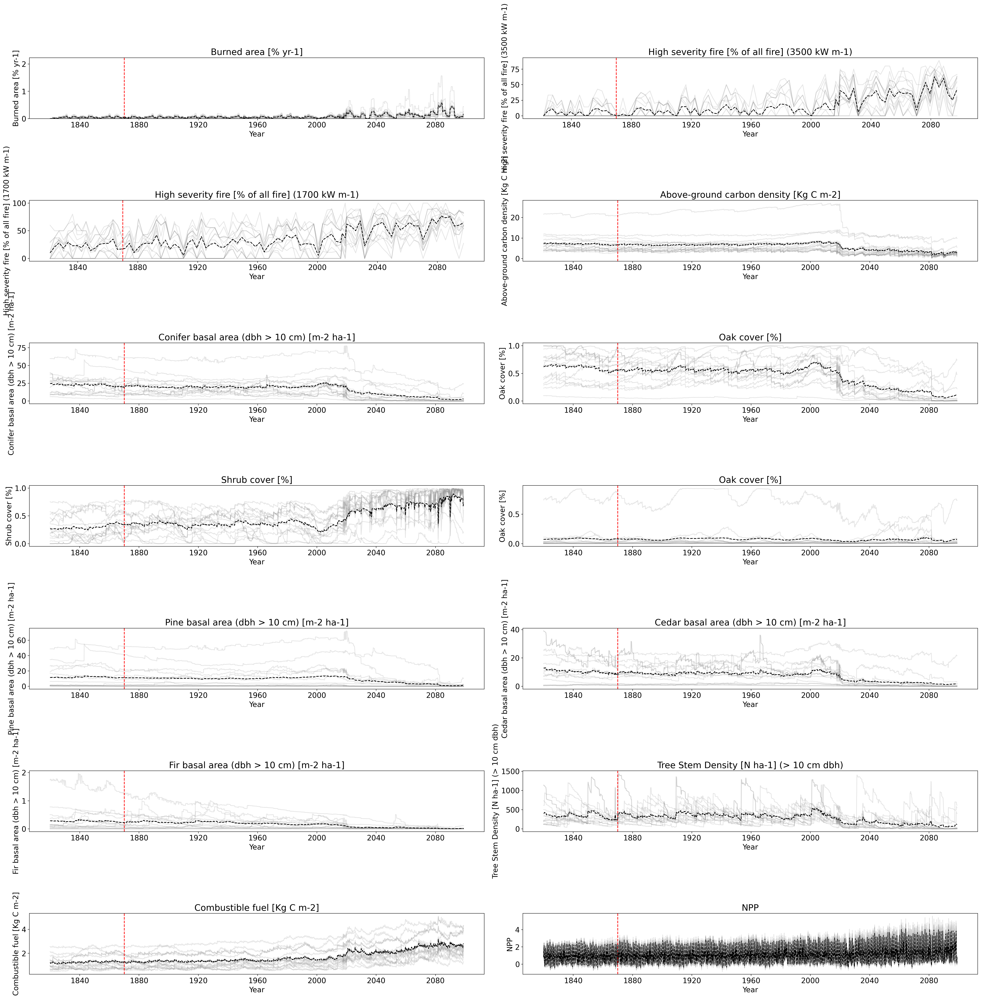

In [42]:
make_ts_fig(ts_HF_data)

## Timeseries no suppression with ig105 for SSP3

/glade/u/home/adamhb/california-fates/figures/ts_supIg105_020224.pdf


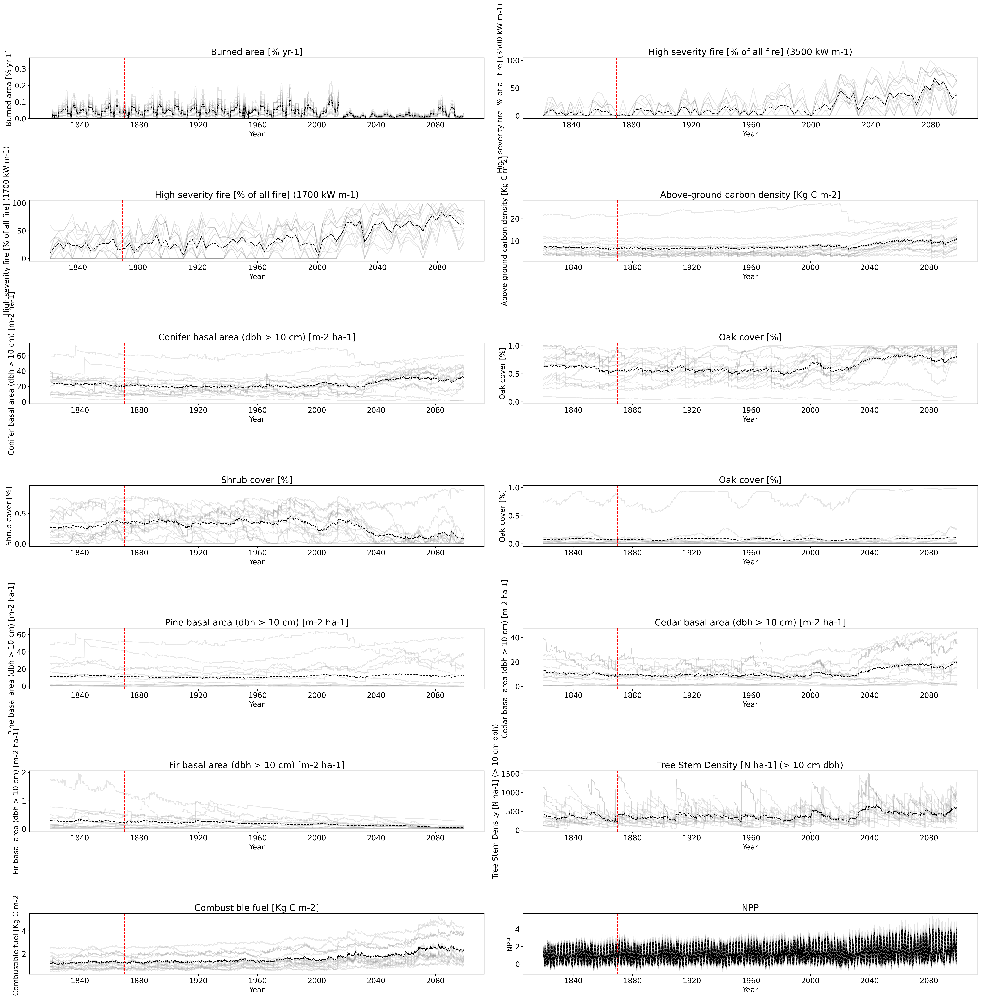

In [16]:
make_ts_fig(ts_HFig105_data)

## Pre-Euro-American forest structure and fire regime

Sources for observed (reconstructed) range of burned area
 *  Williams et al., 2023 (3-9)
 *  In Safford and Stephens, 2017 they report that Stephens et al. (2007) found 5-15%, but lower end of the range is more reliable.

Source for observed (reconstructed range of PHS)
 * Williams et al., 2023
 * Safford and Stevens, 2017: PHS = 4-6 (Fig. 6, p39); Stephens et al., 2015 estimated 1-3 percent from timber survey records

Sources for Total BA 
 * Scholl and Taylor, 2010 (29.5)
 * USDA FS 1911 (21)
 * CZ2, Polly's data (35)
 * Collins et al., 2015 (DRY sits within the landscape analysis) (10.6)
 * Could also add Stephens et al. 2015 (if it makes sense to add together the pft-level BA

Sources for shrub (add the 5 references from dry and wet)
 * Bonnicksen and Stone (1982) (19)
 * Show and Kotok, 1924 via Safford and Stephens, 2017 (11)
 * Collins et al. 2015
 * Stephens et al., 2015
 * Knapp et al., 2012
 * Wang et al., 2022

In [10]:
obs_PEAS = {'Burned_area':[3,11], #Range for burned area was calculated from the FRI estimates given in Table 3. BurnFrac = 1/ FRI. The ranges given in Safford and Stevens, 2017 are larger.
       'Pct_high_severity_3500':[1,6], # Williams+ 2034; Safford and Stevens, 2017, Stephens+ 2015
       'Pct_high_severity_1700':[1,6],
       'BA_conifer':[10.6,35], # 10 cm dbh
       'Pct_shrub_cover_canopy':[9,54], # DRY and WET
      }

# Pick up here with checking if we suppressed the forest too much.
obs_SUP_1980s = {'Burned_area':[0.53487,0.53487],
           'Pct_high_severity_3500':[25,25],
           'BA_conifer':[49,49],
           'Pct_shrub_cover_canopy':[22,22]}

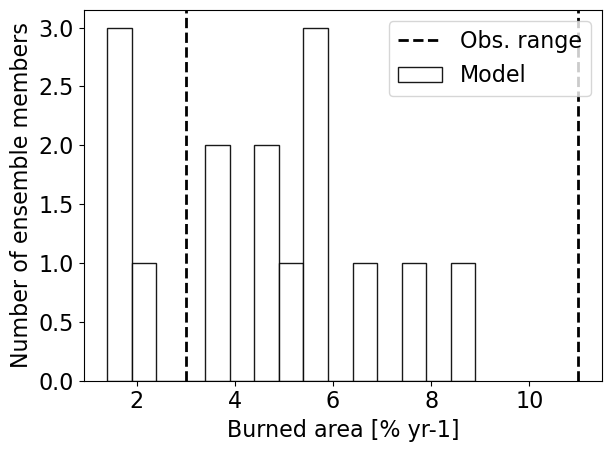

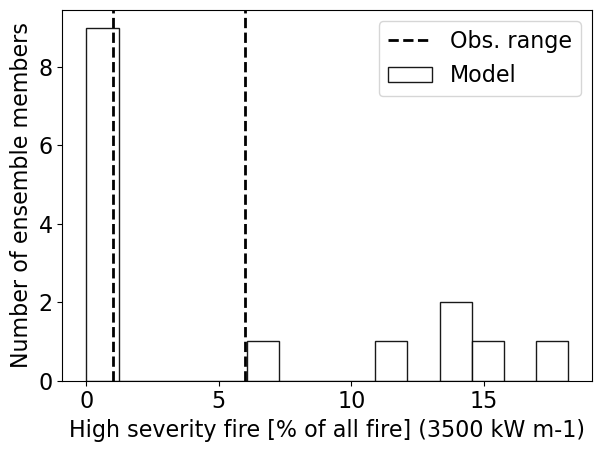

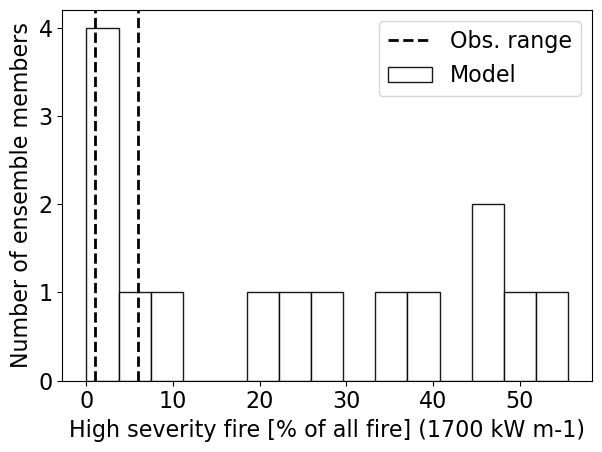

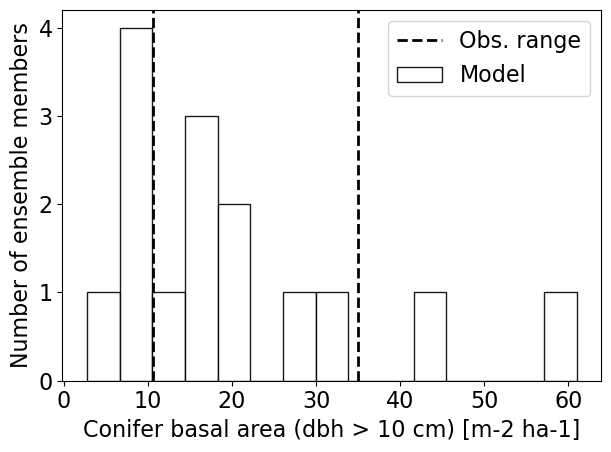

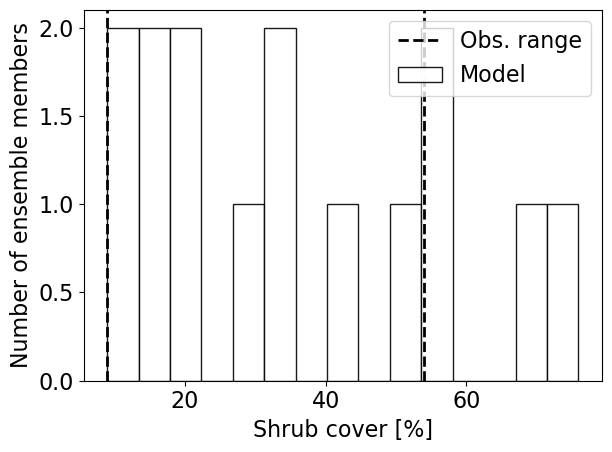

In [11]:
for v in obs_PEAS.keys():
    HistModelObs(met_peas,obs_PEAS, v)

## Suppressed Forest Structure and Fire Regime

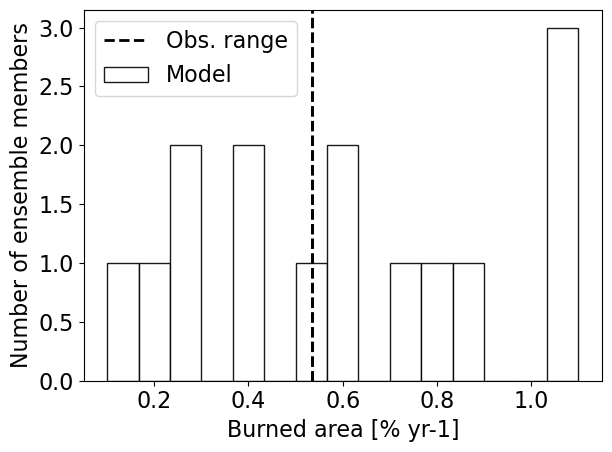

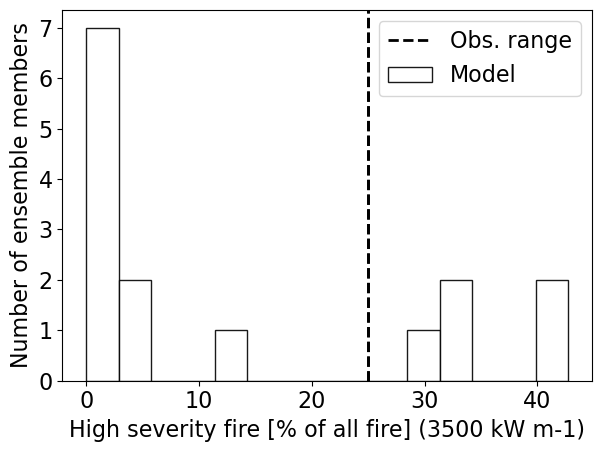

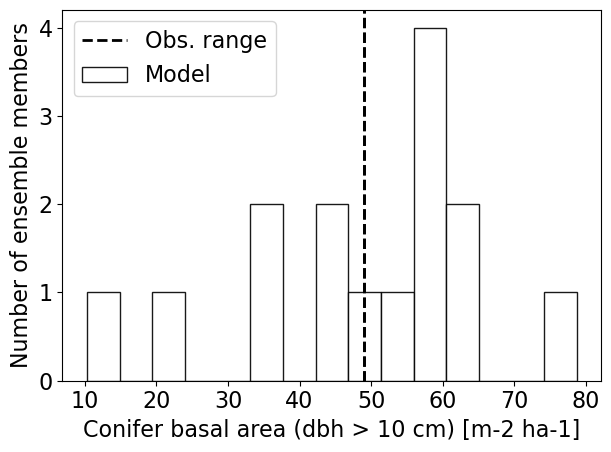

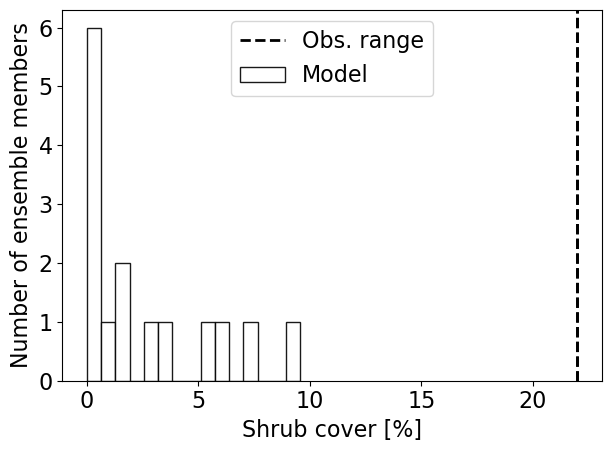

In [13]:
for v in obs_SUP_1980s.keys():
    HistModelObs(met_early20th_sup,obs_SUP_1980s, v)

## Forest response to fire suppression

Early 20th (sup) - PEAS

In [16]:
member_response = metrics_diff(met_early20th_sup,met_peas)
response_to_sup = member_response.select_dtypes(exclude=['object']).mean(axis = 0,skipna=True)
response_to_sup

/glade/derecho/scratch/adamhb/tmp/ipykernel_4151/3633026102.py:27: RuntimeWarning: divide by zero encountered in divide
  delta = (data1 - data2) / data2 * 100
/glade/derecho/scratch/adamhb/tmp/ipykernel_4151/3633026102.py:27: RuntimeWarning: invalid value encountered in divide
  delta = (data1 - data2) / data2 * 100


AGCD                           215.804594
BA_conifer                     236.641868
BA_trees                       232.307665
BA_pine                         95.502751
BA_cedar                       535.218951
BA_fir                         322.711603
BA_shrub                       -90.206350
BA_oak                      115007.728404
TreeStemD                       91.222573
TreeStemD_40                   391.131116
TreeStemD_60                  1679.649639
TreeStemD_80                  3209.133701
TreeStemD_100                45661.705000
ResproutD_oak                  -40.286129
ResproutD_shrub                -30.909443
ShannonE                       -39.934124
NPP                             25.901608
FailedPFTs                      11.111111
Pct_shrub_cover_canopy         -92.078524
Pct_shrub_cover                -80.791251
Combustible_fuel                19.200332
Pct_conifer_cover_canopy       102.361293
Pct_pine_cover_canopy           10.008770
Pct_cedar_cover_canopy         235

## Suppressed forest response to SSP3-7.5

In [17]:
member_response = metrics_diff(met_late_20th_sup,met_early20th_sup)
sup_response_to_SSP3 = member_response.select_dtypes(exclude=['object']).mean(axis = 0,skipna=True)
sup_response_to_SSP3

/glade/derecho/scratch/adamhb/tmp/ipykernel_4151/3633026102.py:27: RuntimeWarning: divide by zero encountered in divide
  delta = (data1 - data2) / data2 * 100
/glade/derecho/scratch/adamhb/tmp/ipykernel_4151/3633026102.py:27: RuntimeWarning: invalid value encountered in divide
  delta = (data1 - data2) / data2 * 100


AGCD                          -30.989808
BA_conifer                    -39.780142
BA_trees                      -34.534093
BA_pine                       -63.775481
BA_cedar                      -24.229761
BA_fir                        -56.034165
BA_shrub                    44030.493834
BA_oak                       4594.852928
TreeStemD                      26.731980
TreeStemD_40                  -53.879479
TreeStemD_60                  -64.295262
TreeStemD_80                   43.090152
TreeStemD_100                  63.839085
ResproutD_oak                1368.314861
ResproutD_shrub               -27.805926
ShannonE                       37.213082
NPP                            44.202422
FailedPFTs                     33.333333
Pct_shrub_cover_canopy      10416.506449
Pct_shrub_cover               322.307875
Combustible_fuel               55.853406
Pct_conifer_cover_canopy      -20.016086
Pct_pine_cover_canopy         -55.275094
Pct_cedar_cover_canopy          3.381371
Pct_fir_cover_ca

## Forest response to 20th century (Healthy Fire)

In [19]:
member_response = metrics_diff(met_early20th_HF,met_peas)
HF_response_to_20th_century = member_response.select_dtypes(exclude=['object']).mean(axis = 0,skipna=True)
HF_response_to_20th_century

/glade/derecho/scratch/adamhb/tmp/ipykernel_4151/3633026102.py:27: RuntimeWarning: divide by zero encountered in divide
  delta = (data1 - data2) / data2 * 100
/glade/derecho/scratch/adamhb/tmp/ipykernel_4151/3633026102.py:27: RuntimeWarning: invalid value encountered in divide
  delta = (data1 - data2) / data2 * 100


AGCD                           20.079688
BA_conifer                     30.365732
BA_trees                       32.367410
BA_pine                       120.499359
BA_cedar                       29.371634
BA_fir                        150.680496
BA_shrub                      -56.656435
BA_oak                      36410.409565
TreeStemD                      67.556140
TreeStemD_40                   43.303433
TreeStemD_60                   58.762711
TreeStemD_80                  112.595898
TreeStemD_100                 820.268207
ResproutD_oak                 193.977075
ResproutD_shrub               109.171391
ShannonE                       -1.936443
NPP                            22.617229
FailedPFTs                     -4.761905
Pct_shrub_cover_canopy         -1.042366
Pct_shrub_cover                 9.242116
Combustible_fuel               27.580510
Pct_conifer_cover_canopy       21.878788
Pct_pine_cover_canopy          25.464006
Pct_cedar_cover_canopy          9.741708
Pct_fir_cover_ca

## Forest response to SSP3-7.5 (Healthy Fire)

In [20]:
member_response = metrics_diff(met_late_20th_HF,met_early20th_HF)
HF_response_to_SSP3 = member_response.select_dtypes(exclude=['object']).mean(axis = 0,skipna=True)
HF_response_to_SSP3

/glade/derecho/scratch/adamhb/tmp/ipykernel_4151/3633026102.py:27: RuntimeWarning: divide by zero encountered in divide
  delta = (data1 - data2) / data2 * 100


AGCD                         -52.465397
BA_conifer                   -91.691157
BA_trees                     -90.598050
BA_pine                      -90.338916
BA_cedar                     -89.896594
BA_fir                       -82.008617
BA_shrub                    1252.613274
BA_oak                       576.709441
TreeStemD                    -84.002661
TreeStemD_40                 -95.949762
TreeStemD_60                 -89.006484
TreeStemD_80                 -94.637560
TreeStemD_100                -78.488181
ResproutD_oak                698.725629
ResproutD_shrub             4190.188453
ShannonE                     -60.580422
NPP                           49.529867
FailedPFTs                   112.222222
Pct_shrub_cover_canopy      2303.201380
Pct_shrub_cover              753.232163
Combustible_fuel              76.608180
Pct_conifer_cover_canopy     -87.066176
Pct_pine_cover_canopy        -79.573027
Pct_cedar_cover_canopy       -84.306753
Pct_fir_cover_canopy         -44.404142


## Resilience gain from HF

The "Healthy Forest" scenario does worse under climate change

In [21]:
HF_response_to_SSP3 - sup_response_to_SSP3

AGCD                          -21.475589
BA_conifer                    -51.911015
BA_trees                      -56.063957
BA_pine                       -26.563435
BA_cedar                      -65.666833
BA_fir                        -25.974452
BA_shrub                   -42777.880561
BA_oak                      -4018.143487
TreeStemD                    -110.734641
TreeStemD_40                  -42.070282
TreeStemD_60                  -24.711223
TreeStemD_80                 -137.727712
TreeStemD_100                -142.327266
ResproutD_oak                -669.589232
ResproutD_shrub              4217.994379
ShannonE                      -97.793504
NPP                             5.327446
FailedPFTs                     78.888889
Pct_shrub_cover_canopy      -8113.305069
Pct_shrub_cover               430.924288
Combustible_fuel               20.754774
Pct_conifer_cover_canopy      -67.050091
Pct_pine_cover_canopy         -24.297933
Pct_cedar_cover_canopy        -87.688124
Pct_fir_cover_ca